# Pretrained model experiments

Follow the instructions in the README to download tapvid-davis 480 dataset with pretrained models and run inference. Helper scripts are in *benchmarking* directory.

In [1]:
import warnings
warnings.filterwarnings("ignore")

import os 
import torch
import numpy as np
import argparse
from dino_tracker import DINOTracker
from models.model_inference import ModelInference
import time

import matplotlib.pyplot as plt
from utils import add_config_paths
from data.data_utils import load_video
import cv2
import tqdm

from models.tracker import Tracker
from data.dataset import RangeNormalizer
from models.utils import load_pre_trained_model

from visualization.viz_utils_tapir import plot_tracks_v2
from data.data_utils import save_video


In [2]:
@torch.no_grad
def get_tracker_stuff(video_path, dev, weights_prefix="10000"):
    video = load_video(video_folder=video_path + "/video", resize=(476, 854)).to(dev)
    range_normalizer = RangeNormalizer(shapes=(854, 476, video.shape[0])).to(dev)
    conf = add_config_paths(video_path, {})
    tracker_args = {
        "video": video,
        "device": dev,
        "dino_embed_path": conf["dino_embed_video_path"],
        "dino_patch_size": 14,
        "stride": 7,
        "ckpt_path": conf["ckpt_folder"],
        "cyc_n_frames": 4,
        "cyc_batch_size_per_frame": 256,
        "cyc_fg_points_ratio": 0.7,
        "cyc_thresh": 4,
    }
    tracker = Tracker(**tracker_args).to(dev)
    
    tracker.tracker_head = load_pre_trained_model(
        torch.load(
            os.path.join(tracker.ckpt_path, f"tracker_head_{weights_prefix}.pt")
        ),
        tracker.tracker_head,
    )
    tracker.delta_dino = load_pre_trained_model(
        torch.load(os.path.join(tracker.ckpt_path, f"delta_dino_{weights_prefix}.pt")),
        tracker.delta_dino,
    )
    model_inference = ModelInference(
        model=tracker,
        range_normalizer=range_normalizer,
        anchor_cosine_similarity_threshold=0.7,
        cosine_similarity_threshold=0.6,
    )
    return (video.permute(0, 2, 3, 1).cpu().numpy() * 255).astype(
        np.uint8
    ), model_inference

In [12]:
@torch.no_grad
def inference_model(
    model: ModelInference, qps: np.ndarray, batch_sz=1, traj_only=False, probs=False
):
    qpts_st_frame = torch.tensor(
        np.concatenate([qps, np.zeros((qps.shape[0], 1))], 1),
        dtype=torch.float32,
        device=model.model.device,
    )  # N x 3, (x, y, t)
    if traj_only:
        trajs = model.compute_trajectories(qpts_st_frame, batch_sz)
        return trajs.cpu().detach().numpy()

    trajs, occl, cos_sims = model.infer_with_prob(qpts_st_frame, batch_sz)
    if not probs:
        return trajs.cpu().detach().numpy(), occl.cpu().detach().numpy()
    else:
        return (
            trajs.cpu().detach().numpy(),
            occl.cpu().detach().numpy(),
            cos_sims.cpu().detach().numpy(),
        )

In [4]:
def get_video_with_tracks_occl(video_path, frame=0, grid=False):
    config_paths = add_config_paths(video_path, {})
    occlusions_dir = (
        config_paths["occlusions_dir"]
        if not grid
        else config_paths["grid_occlusions_dir"]
    )
    video_folder = config_paths["video_folder"]
    trajs_path = os.path.join(
        (
            config_paths["trajectories_dir"]
            if not grid
            else config_paths["grid_trajectories_dir"]
        ),
        f"trajectories_{frame}.npy" if not grid else "grid_trajectories.npy",
    )
    occl_path = os.path.join(
        occlusions_dir,
        f"occlusion_preds_{frame}.npy" if not grid else "grid_occlusions.npy",
    )
    _video = load_video(
        video_folder, num_frames=300
    )  # T x 3 x H x W, torch.float32, [0, 1]
    _video = (_video.permute(0, 2, 3, 1).cpu().numpy() * 255).astype(
        np.uint8
    )  # T x H x W x 3, numpy.uint8, [0, 255]
    _tracks = np.load(trajs_path)  # [N, T, 2]
    _occluded = np.load(occl_path)
    return _video, _tracks, _occluded

In [5]:
def plot_rude_traj(_video, _tracks, pt_indxs, name=None, trail=False):
    colors_cv = [(255, 0, 0), (0, 255, 0), (0, 0, 255)]
    colors_mpl = ["r", "g", "b"]

    img_first = _video[0].copy()
    img_middle = _video[_video.shape[0] // 2].copy()
    img_last = _video[-1].copy()

    fig, ax = plt.subplot_mosaic(
        [["first", "middle", "last"]], constrained_layout=True, figsize=(15, 3)
    )

    for pt_indx, clr_cv, clr_mpl in zip(pt_indxs, colors_cv, colors_mpl):
        cv2.circle(img_first, _tracks[pt_indx, 0].astype(int), 5, clr_cv, 10)
        cv2.circle(
            img_middle,
            _tracks[pt_indx, _video.shape[0] // 2].astype(int),
            5,
            clr_cv,
            10,
        )
        cv2.circle(img_last, _tracks[pt_indx, -1].astype(int), 5, clr_cv, 10)
        if not trail:
            ax["middle"].scatter(
                _tracks[pt_indx, : _video.shape[0] // 2, 0],
                _tracks[pt_indx, : _video.shape[0] // 2, 1],
                c=clr_mpl,
                zorder=5,
                s=6,
            )
            ax["last"].scatter(
                _tracks[pt_indx, _video.shape[0] // 2 :, 0],
                _tracks[pt_indx, _video.shape[0] // 2 :, 1],
                c=clr_mpl,
                zorder=5,
                s=6,
            )
        else:
            ax["middle"].plot(
                _tracks[pt_indx, : _video.shape[0] // 2, 0],
                _tracks[pt_indx, : _video.shape[0] // 2, 1],
                c=clr_mpl,
                zorder=5,
            )
            ax["last"].plot(
                _tracks[pt_indx, _video.shape[0] // 2 :, 0],
                _tracks[pt_indx, _video.shape[0] // 2 :, 1],
                c=clr_mpl,
                zorder=5,
            )

    ax["first"].imshow(img_first)
    ax["middle"].imshow(img_middle)
    ax["last"].imshow(img_last)
    ax["first"].grid(False)
    ax["middle"].grid(False)
    ax["last"].grid(False)
    ax["first"].axis("off")
    ax["middle"].axis("off")
    ax["last"].axis("off")
    if name is not None:
        fig.savefig(f"../Report/figs/{name}.png")

In [6]:
device = "cuda:0"

In [7]:
plt.style.use("bmh")

## Part 1 (basic tests & visualization)

Load basic video data:

In [28]:
video, tracks, occl = get_video_with_tracks_occl("../dataset/tapvid-davis/29")

In [29]:
video.shape

(50, 480, 854, 3)

In [30]:
tracks.shape

(23, 50, 2)

Visualizing set of query points:

(-0.5, 853.5, 479.5, -0.5)

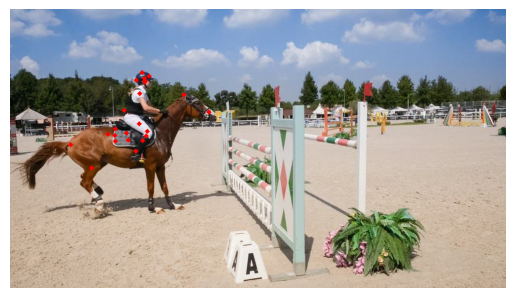

In [31]:
img0 = video[0].copy()
for pt in tracks[:, 0]:
    cv2.circle(img0, pt.astype(int), 2, (255, 0, 0), 4)

plt.imshow(img0)
plt.grid(False)
plt.axis("off")

Plot points trajectories from first to last frames:

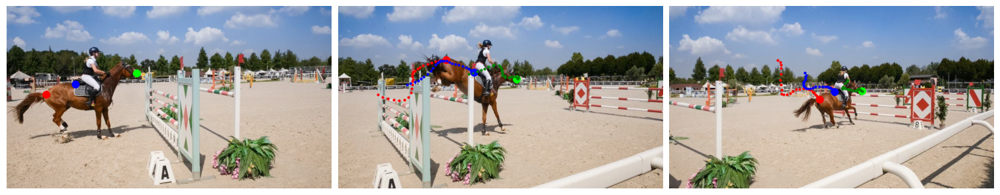

In [32]:
plot_rude_traj(video, tracks, pt_indxs=[0, 3, 5],name="davis-29")

In [34]:
save_video(
    plot_tracks_v2(video, tracks[[0, 3, 5]], occl[[0, 3, 5]] & False, rainbow_colors=True, point_size=100),
    "../dataset/tapvid-davis/29/visualizations/davis-29.mp4",
    fps=10,
)
save_video(
    plot_tracks_v2(video, tracks, occl, rainbow_colors=True, point_size=100),
    "../dataset/tapvid-davis/29/visualizations/davis-29-full.mp4",
    fps=10,
)

[swscaler @ 0x1e7f9b80] Warning: data is not aligned! This can lead to a speed loss
[swscaler @ 0x2f5c0e00] Warning: data is not aligned! This can lead to a speed loss


More experiments:

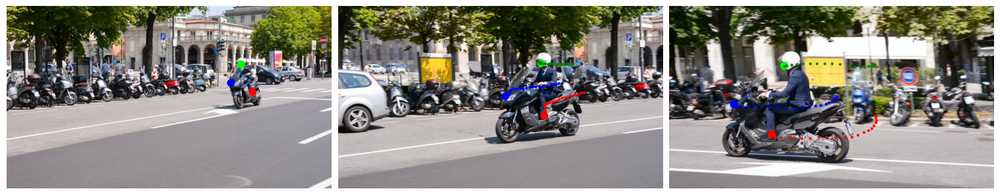

In [26]:
video_1, tracks_1, occl_1 = get_video_with_tracks_occl("../dataset/tapvid-davis/26")
plot_rude_traj(video_1, tracks_1, pt_indxs = [0, 3, 5],name="davis-26")

In [35]:
save_video(
    plot_tracks_v2(video_1, tracks_1[[0, 3, 5]], occl_1[[0, 3, 5]] & False, rainbow_colors=True, point_size=100),
    "../dataset/tapvid-davis/26/visualizations/davis-26.mp4",
    fps=10,
)
save_video(
    plot_tracks_v2(video_1, tracks_1, occl_1, rainbow_colors=True, point_size=100),
    "../dataset/tapvid-davis/26/visualizations/davis-26-full.mp4",
    fps=10,
)

[swscaler @ 0x18203b80] Warning: data is not aligned! This can lead to a speed loss
[swscaler @ 0x27638e00] Warning: data is not aligned! This can lead to a speed loss


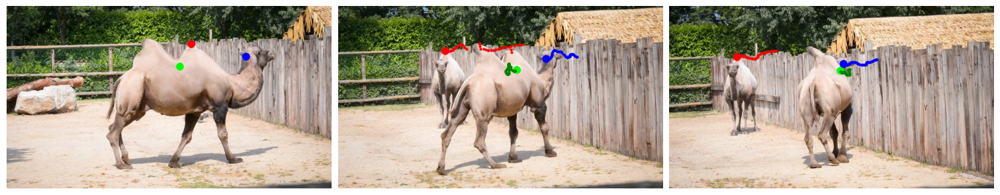

In [24]:
video_2, tracks_2, occl_2 = get_video_with_tracks_occl("../dataset/tapvid-davis/15")
plot_rude_traj(video_2, tracks_2, pt_indxs = [0, 3, 5],name="davis-15")

In [25]:
save_video(
    plot_tracks_v2(video_2, tracks_2[[0, 3, 5]], occl_2[[0, 3, 5]] & False, rainbow_colors=True, point_size=100),
    "../dataset/tapvid-davis/15/visualizations/davis-15.mp4",
    fps=10,
)
save_video(
    plot_tracks_v2(video_2, tracks_2, occl_2, rainbow_colors=True, point_size=100),
    "../dataset/tapvid-davis/15/visualizations/davis-15-full.mp4",
    fps=10,
)

[swscaler @ 0x3832ab80] Warning: data is not aligned! This can lead to a speed loss
[swscaler @ 0x1d8eae00] Warning: data is not aligned! This can lead to a speed loss


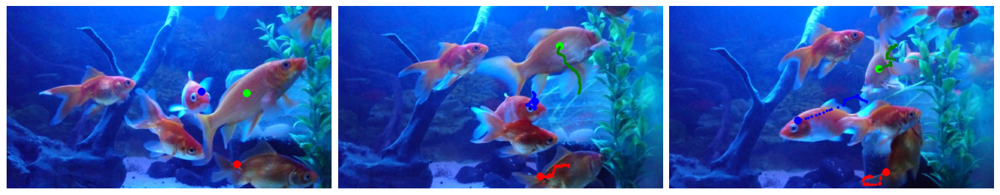

In [39]:
video_3, tracks_3, occl_3 = get_video_with_tracks_occl("../dataset/tapvid-davis/13")
plot_rude_traj(video_3, tracks_3, pt_indxs = [1, 8, 16],name="davis-13",trail=False)

In [40]:
save_video(
    plot_tracks_v2(video_3, tracks_3[[1, 8, 16]], occl_3[[1, 8, 16]] & False, rainbow_colors=True, point_size=100),
    "../dataset/tapvid-davis/13/visualizations/davis-13.mp4",
    fps=10,
)
save_video(
    plot_tracks_v2(video_3, tracks_3, occl_3, rainbow_colors=True, point_size=100),
    "../dataset/tapvid-davis/13/visualizations/davis-13-full.mp4",
    fps=10,
)

[swscaler @ 0x16518b80] Warning: data is not aligned! This can lead to a speed loss
[swscaler @ 0x40434e00] Warning: data is not aligned! This can lead to a speed loss


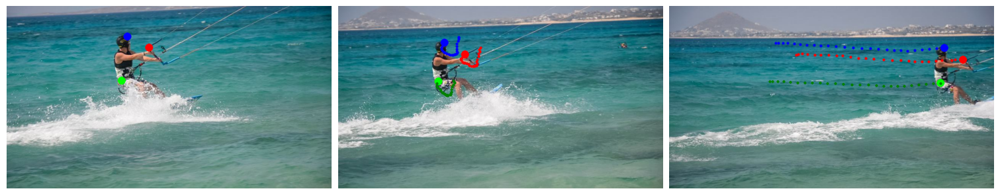

In [36]:
video_4, tracks_4, occl_4 = get_video_with_tracks_occl("../dataset/tapvid-davis/21")
plot_rude_traj(video_4, tracks_4, pt_indxs = [0,15,8],name="davis-21")

In [37]:
save_video(
    plot_tracks_v2(video_4, tracks_4[[0,15,8]], occl_4[[0,15,8]]&False, rainbow_colors=True, point_size=100),
    "../dataset/tapvid-davis/21/visualizations/davis-21.mp4",
    fps=10,
)
save_video(
    plot_tracks_v2(video_4, tracks_4, occl_4, rainbow_colors=True, point_size=100),
    "../dataset/tapvid-davis/21/visualizations/davis-21-full.mp4",
    fps=10,
)

[swscaler @ 0x3d3abb80] Warning: data is not aligned! This can lead to a speed loss
[swscaler @ 0x23564e00] Warning: data is not aligned! This can lead to a speed loss


## Part 2 (metrics)

After performing inference on every video in dataset the metrics are computed (following the instruction in README)

In [17]:
import pandas as pd

Get average metrics on dataset

In [18]:
metrics_data = pd.read_csv("../tapvid/comp_metrics_davis.csv")
metrics_data = np.round(metrics_data,5)[["video_idx", "occlusion_accuracy", "average_jaccard", "average_pts_within_thresh"]]
metrics_data.to_csv("../tapvid/comp_metrics_davis_red.csv")
metrics_data.iloc[-1,:]

video_idx                    average
occlusion_accuracy            0.8855
average_jaccard              0.65279
average_pts_within_thresh    0.80668
Name: 30, dtype: object

Promised values in README "average_pts_within_thresh: 0.8066 | occlusion_acc: 0.8854 | average_jaccard: 0.6528":

In [19]:
metrics_data.iloc[-1,:]["average_pts_within_thresh"], metrics_data.iloc[-1,:]["occlusion_accuracy"], metrics_data.iloc[-1,:]["average_jaccard"]

(0.80668, 0.8855, 0.65279)

As we can see they are on appropriate level

## Part 3 (Performance)

In [ ]:
frames = []
times = []
for vid_idx in tqdm.tqdm(range(30)):
    vid, model_inf = get_tracker_stuff(
        f"../dataset/tapvid-davis/{vid_idx}", device
    )
    queries = np.array([[vid.shape[-1] // 2, vid.shape[-2] // 2]])
    start_time = time.time()
    _ = inference_model(model_inf, queries, traj_only=True)
    times.append(time.time() - start_time)
    frames.append(vid.shape[0])
    del model_inf

frames = np.array([frames[1:]]).T
times = np.array([times[1:]]).T

100%|██████████| 30/30 [02:26<00:00,  4.90s/it]


In [21]:
import sklearn.linear_model


lr = sklearn.linear_model.LinearRegression(fit_intercept=False)
lr.fit(frames, times)
lr.coef_

array([[0.00409885]])

Text(0, 0.5, 'Время обработки, [с]')

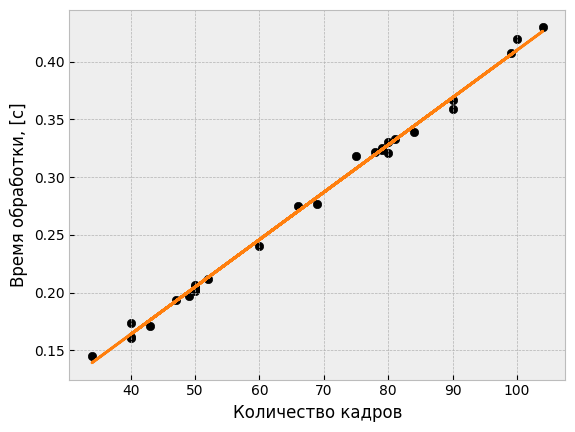

In [22]:
plt.scatter(frames, times,c="black")
plt.plot(frames, lr.predict(frames), c="tab:orange")
plt.xlabel("Количество кадров")
plt.ylabel("Время обработки, [с]")


It takes ~ 0.004s to predict trajectory points with batch size 1. Memory consumption ~ 14-15Gb.

## Part 4 (Multi-tracking)

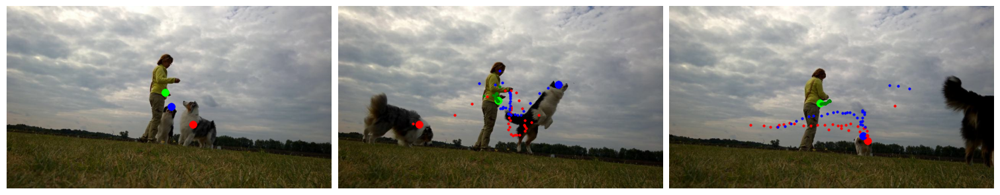

In [23]:
video_test, tracks_test, occl_test = get_video_with_tracks_occl("../dataset/tapvid-davis/8")
plot_rude_traj(video_test, tracks_test, pt_indxs = [0,10,12])

In [24]:
masks = cv2.imread("../dataset/tapvid-davis/8/masks/00000.png")
masks.shape

(480, 854, 3)

In [25]:
N = 50
colors = np.unique(masks.reshape((-1, 3)), axis=0)[1:]
queries = []
for col in colors:
    indices = np.where(np.all(masks == col, axis=-1))
    ids = np.random.choice(range(indices[0].shape[0]), N, False)
    queries.append(
        np.concatenate(
            [indices[1][ids].reshape((-1, 1)), indices[0][ids].reshape((-1, 1))], axis=1
        )
    )

queries = np.concatenate(queries)
queries.shape

(150, 2)

(-0.5, 853.5, 479.5, -0.5)

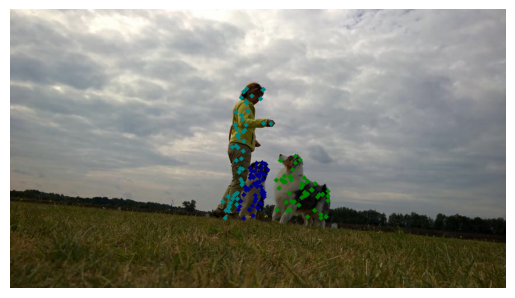

In [26]:
img0 = video_test[0].copy()
for cl_id, color in enumerate(colors):
    for pt in queries[N*cl_id:N*(cl_id+1)]:
        cv2.circle(img0, pt.astype(int), 2, tuple(map(int,color)), 4)

plt.imshow(img0)
plt.grid(False)
plt.axis("off")

In [27]:
vid, model_inf = get_tracker_stuff("../dataset/tapvid-davis/8", device)
trajs_test, occl_test = inference_model(model_inf, queries, batch_sz=20)

Interating over query points: 100%|██████████| 150/150 [07:19<00:00,  2.93s/it]


In [41]:
occl_test.shape

(150, 66)

## Part 5 (Custom data)

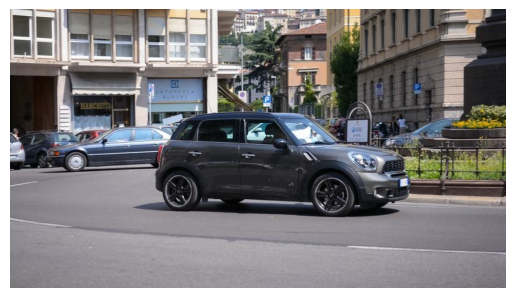

In [14]:
plt.imshow(
    cv2.cvtColor(
        cv2.imread("../dataset/tapvid-davis/1/video/00000.jpg"), cv2.COLOR_BGR2RGB
    )
)
plt.axis("off")
plt.grid(False)

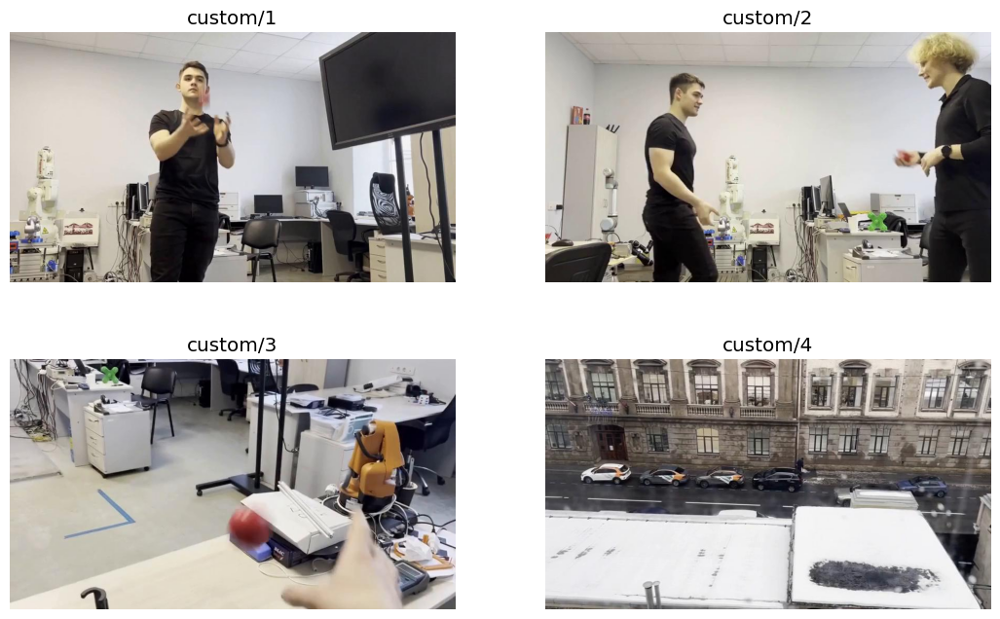

In [36]:
_, ax = plt.subplots(2,2,figsize=(13,8))
for i in range(4):
    img = cv2.cvtColor(cv2.imread(f"../dataset/custom/{i+1}/video/00012.jpg"), cv2.COLOR_BGR2RGB)
    ax[i//2, i%2].imshow(img)
    ax[i//2, i%2].axis("off")
    ax[i//2, i%2].grid(False)
    ax[i//2, i%2].set_title(f"custom/{i+1}")

### Video 4

In [8]:
queries = np.random.uniform([730,255],[810,280],(100,2))

Trained on this data model:

In [9]:
vid4, model_inf = get_tracker_stuff("../dataset/custom/4", device)

In [10]:
tr, occl = inference_model(model_inf, queries,batch_sz=50)

Interating over query points: 100%|██████████| 100/100 [01:56<00:00,  1.16s/it]


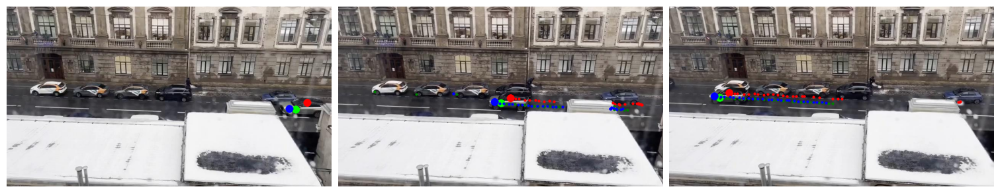

In [16]:
plot_rude_traj(vid4, tr, pt_indxs=[0,1,2])

In [17]:
save_video(
    plot_tracks_v2(vid4, tr, occl, rainbow_colors=True, point_size=100),
    "../dataset/custom/4/visualizations/custom_4_trained.mp4",
    fps=10,
)

[swscaler @ 0x1b822b80] Warning: data is not aligned! This can lead to a speed loss


Model with similar semantics:

In [18]:
vid4, model_inf = get_tracker_stuff("../dataset/custom/4", device, "semantic_10000")

In [19]:
tr, occl = inference_model(model_inf, queries, batch_sz=20)

Interating over query points: 100%|██████████| 100/100 [00:14<00:00,  6.90it/s]


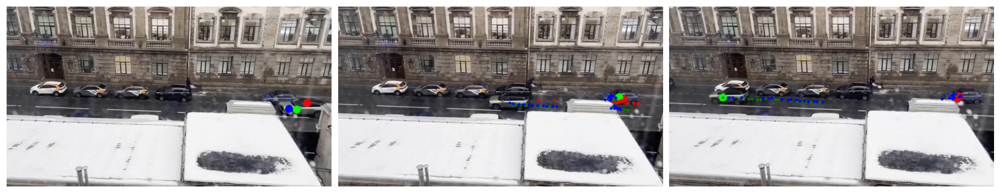

In [20]:
plot_rude_traj(vid4, tr, pt_indxs=[0,1,2])

In [21]:
save_video(
    plot_tracks_v2(vid4, tr, occl, rainbow_colors=True, point_size=100),
    "../dataset/custom/4/visualizations/custom_4_pretrained_semantic.mp4",
    fps=10,
)

[swscaler @ 0x22ff9e00] Warning: data is not aligned! This can lead to a speed loss


Model with bad semantic:

In [22]:
vid4, model_inf = get_tracker_stuff("../dataset/custom/4", device, "bad_semantic_10000")

In [23]:
tr, occl = inference_model(model_inf, queries, batch_sz=20)

Interating over query points: 100%|██████████| 100/100 [00:20<00:00,  4.81it/s]


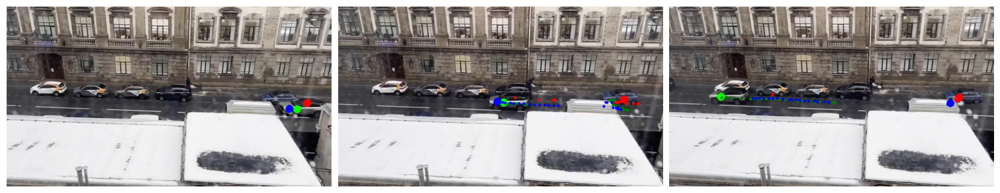

In [24]:
plot_rude_traj(vid4, tr, pt_indxs=[0,1,2])

In [25]:
save_video(
    plot_tracks_v2(vid4, tr, occl, rainbow_colors=True, point_size=100),
    "../dataset/custom/4/visualizations/custom_4_pretrained_bad_semantic.mp4",
    fps=10,
)

[swscaler @ 0x3a523e00] Warning: data is not aligned! This can lead to a speed loss


### Video 3

In [8]:
queries = np.random.uniform([500,270],[660,400],(100,2))

In [9]:
vid3, model_inf = get_tracker_stuff("../dataset/custom/3", device, "10000")

(-0.5, 853.5, 475.5, -0.5)

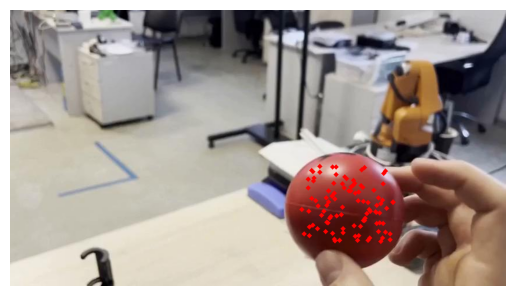

In [19]:
img0 = vid3[0].copy()

for pt in queries:
    cv2.circle(img0, pt.astype(int), 2, (255,0,0), 4)

plt.imshow(img0)
plt.grid(False)
plt.axis("off")

In [10]:
tr, occl = inference_model(model_inf, queries,batch_sz=50)

Interating over query points: 100%|██████████| 100/100 [00:38<00:00,  2.58it/s]


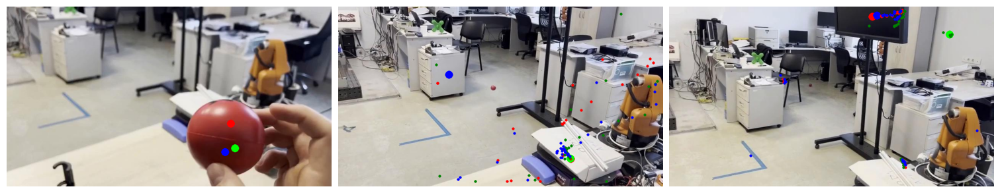

In [21]:
plot_rude_traj(vid3, tr, pt_indxs=[0,1,2])

In [22]:
save_video(
    plot_tracks_v2(vid3, tr, occl, rainbow_colors=True, point_size=100),
    "../dataset/custom/3/visualizations/custom_3_trained.mp4",
    fps=10,
)

[swscaler @ 0x29a2db80] Warning: data is not aligned! This can lead to a speed loss


### Video 1

In [ ]:
vid1, model_inf = get_tracker_stuff("../dataset/custom/1", device, "10000")

In [42]:
queries = np.random.uniform([300,340],[330,370],(100,2))

(-0.5, 853.5, 475.5, -0.5)

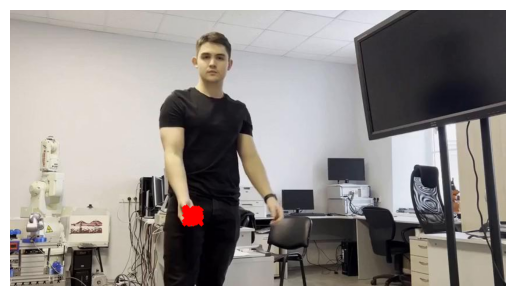

In [43]:
img0 = vid1[0].copy()

for pt in queries:
    cv2.circle(img0, pt.astype(int), 2, (255,0,0), 4)

plt.imshow(img0)
plt.grid(False)
plt.axis("off")

In [44]:
tr, occl = inference_model(model_inf, queries,batch_sz=20)

Interating over query points: 100%|██████████| 100/100 [02:28<00:00,  1.49s/it]


In [ ]:
plot_rude_traj(vid1[:20], tr[:,:20], pt_indxs=[10, 20, 30])

In [47]:
save_video(
    plot_tracks_v2(vid1, tr, occl, rainbow_colors=True, point_size=100),
    "../dataset/custom/1/visualizations/custom_1_trained.mp4",
    fps=10,
)

[swscaler @ 0x5f4cb80] Warning: data is not aligned! This can lead to a speed loss


Probs

In [8]:
vid4, model_inf = get_tracker_stuff("../dataset/custom/4", device)

In [10]:
queries = np.random.uniform([730,255],[810,280],(100,2))

In [13]:
tr, occl, probs = inference_model(model_inf, queries, batch_sz=20, probs=True)

Interating over query points: 100%|██████████| 100/100 [01:58<00:00,  1.19s/it]


In [15]:
probs.shape, tr.shape

((100, 50), (100, 50, 2))

In [34]:
new_vid = []
for i in range(len(vid4)):
    frame = vid4[i].copy()
    cv2.circle(frame, tr[0, i].astype(int), 5, (255, 0, 0), 10)
    cv2.putText(
        frame,
        str(np.round(probs[0, i],2)),
        tr[0, i].astype(int) - 20,
        cv2.FONT_HERSHEY_SIMPLEX,
        1,
        (255, 0, 0),
        2,
        cv2.LINE_AA,
        False,
    )
    new_vid.append(frame)

In [35]:
save_video(
    new_vid,
    "../test.mp4",
    fps=10,
)

[swscaler @ 0x3a07bc00] Warning: data is not aligned! This can lead to a speed loss


(-0.5, 853.5, 475.5, -0.5)

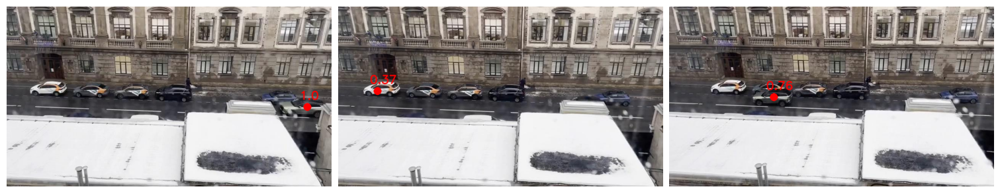

In [39]:
fig, ax = plt.subplot_mosaic(
    [["first", "middle", "last"]], constrained_layout=True, figsize=(15, 3)
)


ax["first"].imshow(new_vid[0])
ax["middle"].imshow(new_vid[10])
ax["last"].imshow(new_vid[40])
ax["first"].grid(False)
ax["middle"].grid(False)
ax["last"].grid(False)
ax["first"].axis("off")
ax["middle"].axis("off")
ax["last"].axis("off")